## 프로젝트 : 다양한 OCR모델 비교하기

#### 배경

- `Google OCR API`, `keras-ocr`, `Tesseract` 사용해봤다.
- 엔지니어 롤이 되어 빠르게 OCR product를 내야 하는데, 이 세 가지의 모델 중 고르려 한다.
- 이 세 가지 OCR 모델을 기술검증해본다.

In [1]:
!sudo apt install --yes tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.


In [2]:
! pip install --upgrade pytesseract

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [3]:
# 패키지 불러오기
import keras_ocr
import pytesseract
import cv2
import numpy as np

print(keras_ocr.__version__)
print(pytesseract.__version__)
print(cv2.__version__)
print(np.__version__)

0.8.6
0.3.9
4.5.1
1.19.5


### 구현하려는 서비스 및 연구 목표 설정
-------
> **배경**
> - 어린 아이들의 글쓰기는 아직 성인만큼의 가독성이 나오지 않는다.
> - 글자 크기가 일정하지 않고,
> - 글자들의 줄맞춤도 일정하지 않다.
> - 이런 아이들의 글자를 인식해서 의도한 글자가 아닌 게 나오면 이를 통해 아이들의 글씨를 개선시켜줄 수 있지 않을까?  
>
> **구현 서비스**
> - 유치원생 아이들의 글쓰기를 개선해줄 수 있는 글자 인식 모델을 만들자!_(언어는 영어)_
>
> **검증 방법**
> - 1차적으로는 이미지마다 내 사람이 판별 가능한 단어 개수(Ground Truth)를 책정한다.
> - 2차적으로는 이미지마다 모델별 정확히 판별해낸 단어 개수(Prediction)를 책정한다.(Ground Truth와 위치가 다른 단어는 틀린 것으로 간주)
> - $i$ : 이미지 인덱스, $j$ : 모델 인덱스, $\sum_{j=1, 2, 3} PR^{ij} - GT^{ij} $로 계산해서 가장 높은 점수를 가진 모델을 선별한다.

## Step1. 검증용 데이터셋 준비
---
- OCR 기능에 영향을 미치는 요소들을 파악한다.(텍스트 모양, 크기, 노이즈, 종횡 배치)
- 내가 `detect` 및 `recognise`하려는 언어에 대한 윗 요소들의 관련성을 생각해보자.
- 요소들의 관련성을 토대로 많은 variation에 대해 robust한 모델이 나올 수 있도록 데이터를 모아보자.

- ##### 테스트 데이터는 아무리 많아도 9장만 사용 예정

> #### note:
> - 서비스의 목적이 '기계도 알아볼수 있게 아이들의 손글씨 실력을 향상시키자'인 만큼 인식률 향상을 위한 이미지 전처리는 시행하지 않는다.
> - 살짝 실험했을 때 이미지 내 글자가 rotate된 경우 recognition에 어려움이 있어서 입력 이미지는 다 가로로 쓰여진 정상적인 이미지를 사용한다.
> - 데이터 중 사람이 글자를 판별하기 어려운 데이터도 일부러 넣어봤다._(8번째 이미지 : `en_data[7]`)_

##### ... 데이터 불러오기

In [4]:
# 데이터 불러오기
import os

root_path = os.getenv("HOME") + '/aiffel/ocr_python/en_'

en_data = []
for i in range(1, 10):
    temp = cv2.imread(root_path + f'{str(i).zfill(2)}.jpeg')
    temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
    en_data.append(temp)

In [5]:
# type 및 shape 확인
print(len(en_data))
print(type(en_data[0]))
print(en_data[0].shape)

9
<class 'numpy.ndarray'>
(500, 500, 3)


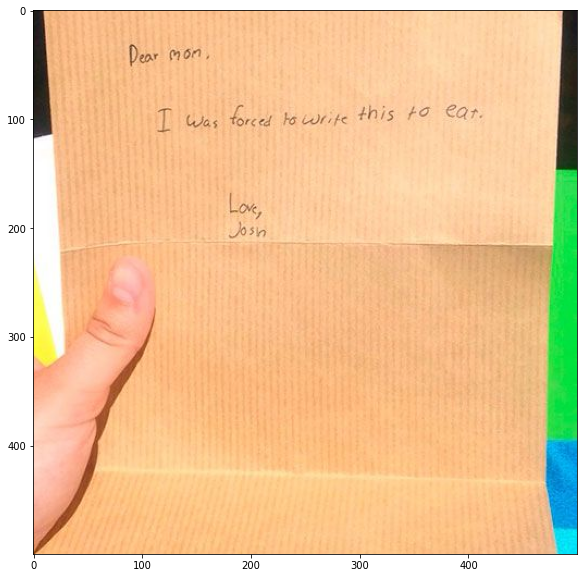

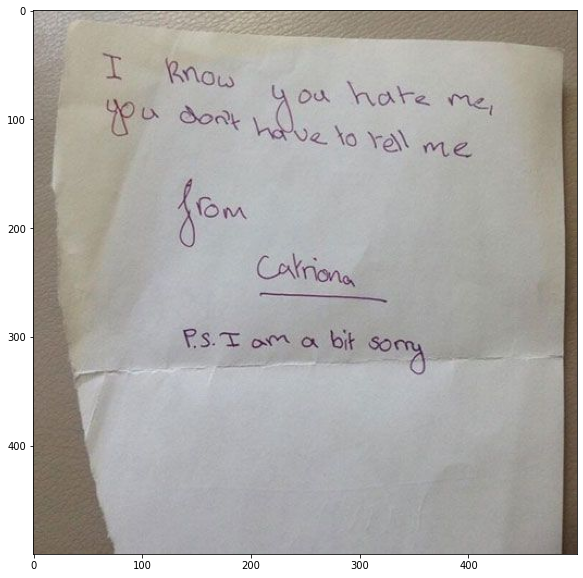

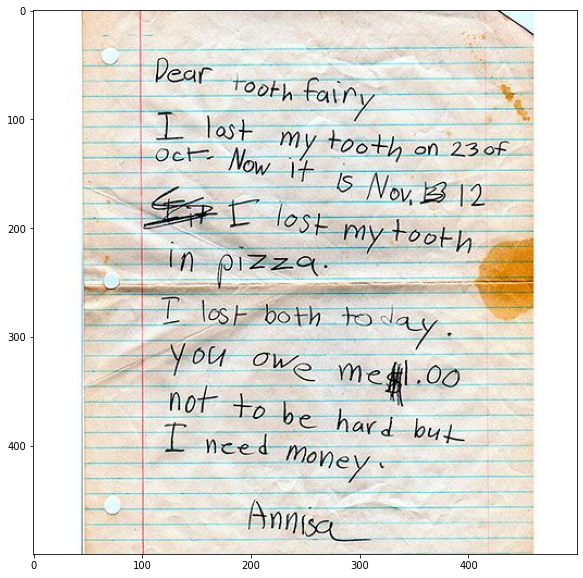

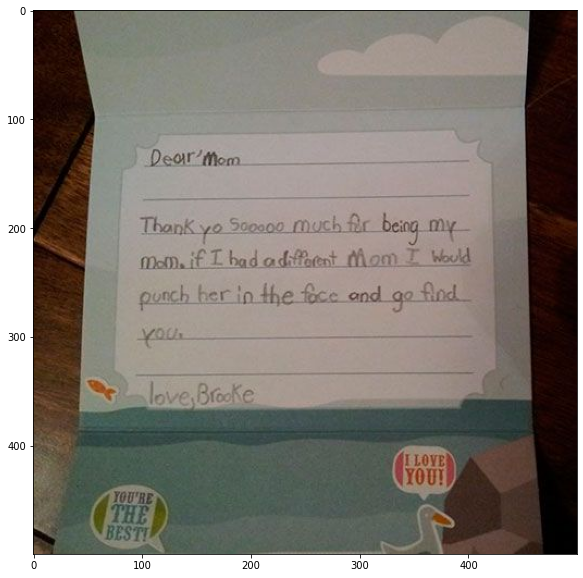

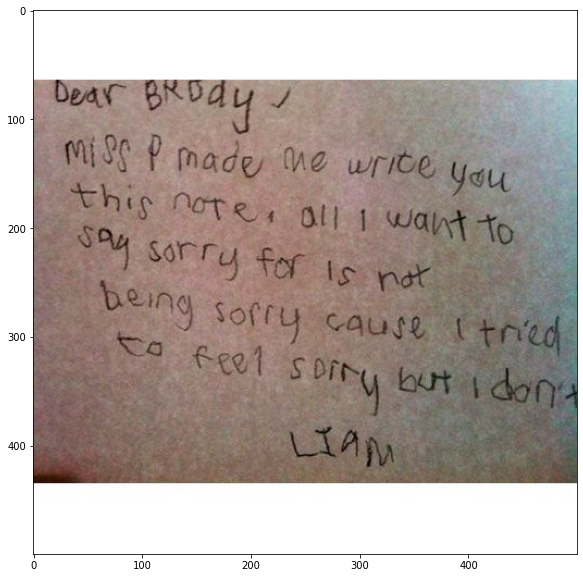

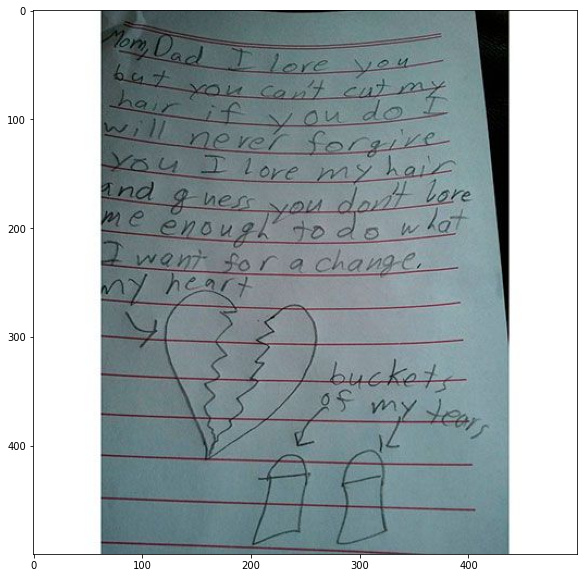

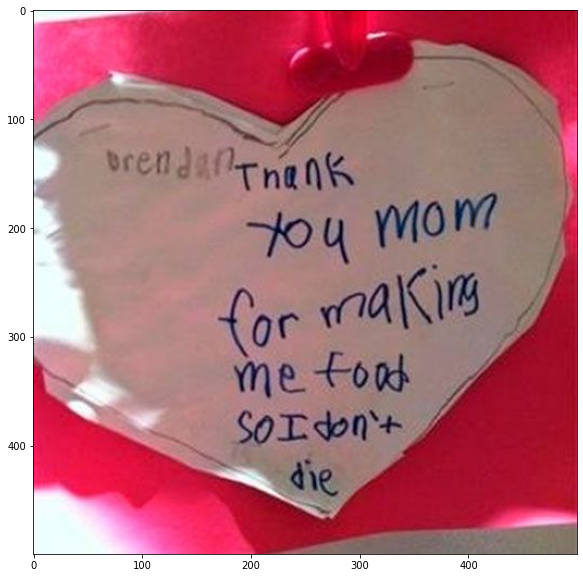

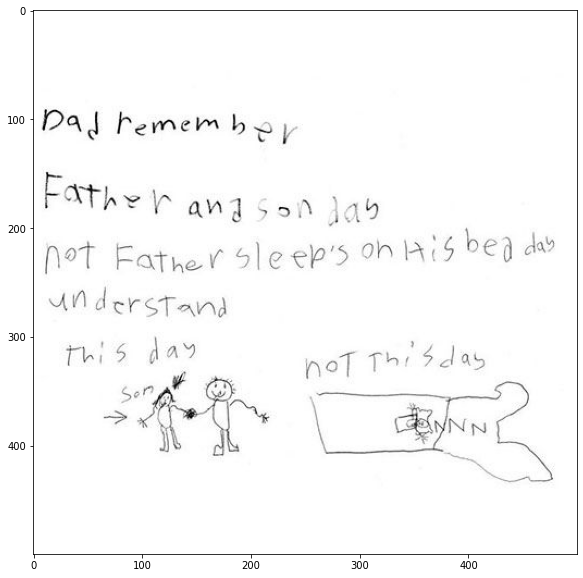

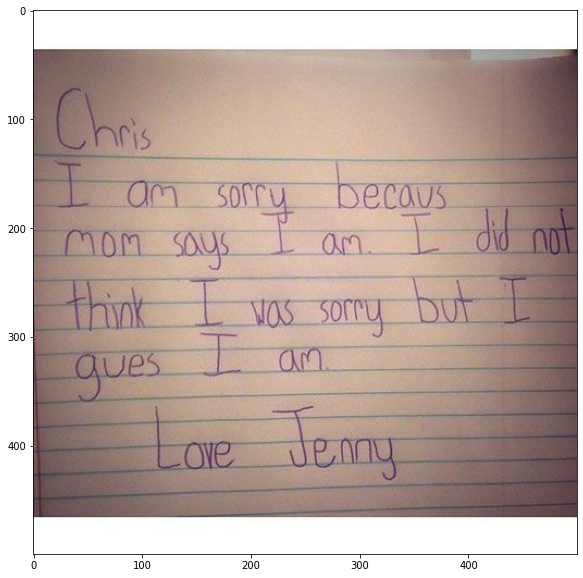

In [6]:
# 이미지 확인
import matplotlib.pyplot as plt

for i in range(9):
    plt.figure(figsize=(14,10))
    plt.imshow(en_data[i])
    
plt.show()

In [7]:
# 이미지별 라벨 준비(정답 텍스트)
sentences = []

sen_01 = 'dear mom, i was forced to write this to eat. love, josh'
sen_02 = "I know you hate me, you don't have to tell me from Catriana P.S. I am a bit sorry"
sen_03 = "Dear tooth fairy I lost my tooth on 23 of Oct. now it is Nov 12 I lost my tooth in pizza. I lost both today. You owe me 1.00 not to be hard but I need money. Annisa"
sen_04 = "Dear mom Thank yo sooooo much for being my mom. if I had a different mom I would punch her in the face and go find you. love, Brooke"
sen_05 = "Dear Brody, miss P made me write you this note. all I want to say sorry for is not being sorry cause I tried to feel sorry but I don't Liam"
sen_06 = "Mom, Dad I love you but you can't cut my hair if you do I will never forgive you I love my hair and guess you don't love me enough to do what I want for a change. my heart buckets of my tears"
sen_07 = "Brendan Thank you mom for making me food so I don't die"
sen_08 = "Dad remember FAther and son day not Father sleep's on it is bed day understand this day son not this day NNN"
sen_09 = "Chris I am sorry becaus mom says I am. I did not think I was sorry but I gues I am. Love Jenny"

sentences.append(sen_01)
sentences.append(sen_02)
sentences.append(sen_03)
sentences.append(sen_04)
sentences.append(sen_05)
sentences.append(sen_06)
sentences.append(sen_07)
sentences.append(sen_08)
sentences.append(sen_09)

# 테스트로 출력해보기
print(len(sentences))
print(sentences[0])

9
dear mom, i was forced to write this to eat. love, josh


In [8]:
# 텍스트 전처리 함수 정의
import re

def text_preprocess(text):
    if type(text) == str:
        text = text.lower() # keras_ocr의 판독 결과가 lower case여서 전부 다 lower로 맞춰줌
        text = re.sub(r"[,.']", '', text)
        text = text.split()
    elif type(text) == list:
        temp_text = []
        for word in text:
            word = word.lower()
            word = re.sub(r"[,.']", '', word)
            temp_text.append(word)
        text = temp_text
    return text

In [9]:
# 전처리 후 담기
labels = []
for line in sentences:
    labels.append(text_preprocess(line))

# 테스트로 출력해보기
print(len(labels))
print(labels[0])

9
['dear', 'mom', 'i', 'was', 'forced', 'to', 'write', 'this', 'to', 'eat', 'love', 'josh']


> #### note:
> - 현재 labels 는 ragged_list 의 모양을 갖고 있다.

## Step2. keras-ocr, Tesseract로 테스트 진행(Google OCR API는 선택 사항)
---
- Google OCR은 계정 생성에 약간 어려움이 있어서 다른 모델을 써보려 한다.
- 대신 `EasyOCR`이라는 오픈소스 라이브러리를 사용해서 총 3개의 모델에 대한 평가를 진행하도록 하겠다.
  - `EasyOCR`은 약 80개의 언어가 훈련된 OCR 모델이다.
  - `EasyOCR`은 아래와 같은 모델 구조를 갖는다.
  - > 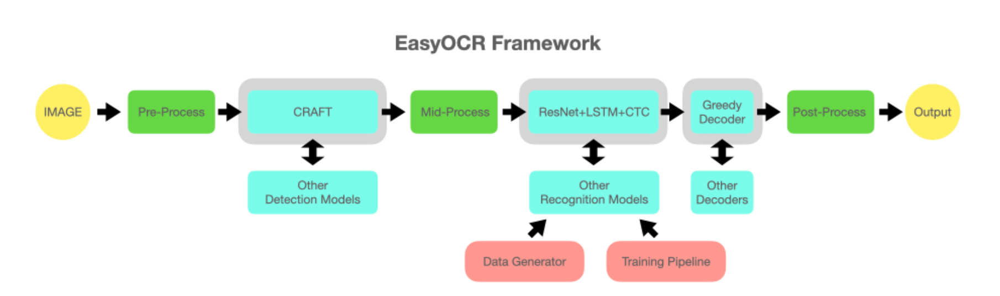

### - keras-ocr

In [10]:
# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드한다.
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [11]:
# 이미지들을 인식해보자.
prediction_groups = []
for img in en_data:
    prediction_groups.append(pipeline.recognize([img])) # .recognize(img) 로 하면 오류

# prediction_groups는 (word, box) 형태의 tuple들이 모여있다.
print(len(prediction_groups))

9


In [12]:
# prediction_groups 중 텍스트만 가져 오기
# 텍스트만 가져오는 이유는 위에 만든 라벨과 비교하기 위함
prediction_texts = []
for i in range(len(prediction_groups)):
    sub_text = []
    for j in range(len(prediction_groups[i][0])):
        sub_text.append(prediction_groups[i][0][j][0])
    prediction_texts.append(sub_text)

print(len(prediction_texts))
prediction_texts

9


[['dear',
  'on',
  'eats',
  'hhis',
  'torced',
  'jo',
  'lo',
  'corafs',
  'was',
  'long',
  'osh'],
 ['t',
  'bnow',
  'hate',
  'ds',
  'cet',
  'pou',
  'soak',
  'ha',
  'io',
  'do',
  'rell',
  'me',
  'ow',
  'chrions',
  'ps',
  'bit',
  'a',
  'csna',
  'o',
  'sonn'],
 ['dear',
  'tooth',
  'falry',
  't',
  'lat',
  'my',
  'tooth',
  '23of',
  'on',
  'octs',
  'now',
  'it',
  'nov',
  'ls',
  '3312',
  'es',
  'lost',
  'mytooth',
  'in',
  'fizzn',
  't',
  'ose',
  'both',
  'fo',
  'sjay',
  'yol',
  'owe',
  'mefloo',
  'not',
  'to',
  'be',
  'hard',
  'bul',
  'nced',
  'money',
  'annisa'],
 ['deor',
  'mom',
  'dc',
  'being',
  'thank',
  'much',
  'scood',
  'mt',
  'lo',
  'houd',
  't',
  'mon',
  't',
  'f',
  'badadoet',
  'mode',
  'tod',
  'ber',
  'the',
  'focc',
  'qunch',
  'lo',
  'and',
  '9o',
  'vous',
  'booke',
  'love',
  'loye',
  'yout',
  'youre',
  'the',
  'besti'],
 ['deay',
  'brday',
  'ps',
  'd',
  'm',
  'maop',
  'me',
  'writ

> #### note:
> **여기서 사용하는 Ground Truth 와 Prediction의 비교 방법은 아래와 같다.**    
> - 1) Ground Truth, Prediction 둘 다 1개의 `list` 안에 9개의 이미지 인식 결과를 `list`로서 가진다.  
> - 2) 9개 이미지의 인식 결과 `list`는 세부적으로 각각 이미지에서 인식된 단어들을 구분지어 요소로 갖는다.  
> - 3) 예를 들어 첫번째 이미지의 인식 결과 3개의 단어가 인식 됐으면 아래와 같은 구조를 갖는다.  
>   -  `[['dear', 'on', 'eats'] ... ]`  
> - 4) 이렇게 Ground Truth와 Prediction을 동일한 구조의 `ragged_list` 형태로 만들고 for loop을 통해 Ground Truth의 단어와 동일한 위치에 있는 단어의 동일 여부를 판단한다.   
> - 5) 이 때 character를 기준으로 하는 것이 아닌 word를 기준으로 맞힌 개수를 카운트한다.

##### ... 성능 검증

In [13]:
for i in range(9):
    print('===================')
    count = 0
    
    # labels와 prediction_texts간 단어 개수가 다른 경우가 있지만,
    # Ground Truth인 labels의 길이에 맞춰서 진행
    for j in range(len(labels[i])):
        
        # Ground Truth와 길이가 같다면 에러가 안 날 것임
        try:
            print(labels[i][j] == prediction_texts[i][j], labels[i][j], prediction_texts[i][j])
            if labels[i][j] == prediction_texts[i][j]:
                count += 1
        
        # Ground Truth와 길이가 다르고, Ground Truth의 길이가 더 길다면 Index out of range 에러가 날 것임
        # Ground Truth와 길이가 다르고, 더 긴 것은 어차피 오답이니 계산하지 않음
        except:
            print(False, labels[i][j], '-')
    
    print('')
    print(f'{count} got right in total')    
    print(f"{round(count/len(labels[i])*100, 2)}% of Prediction are right based on words and their locations of GT")
    print('')

True dear dear
False mom on
False i eats
False was hhis
False forced torced
False to jo
False write lo
False this corafs
False to was
False eat long
False love osh
False josh -

1 got right in total
8.33% of Prediction are right based on words and their locations of GT

False i t
False know bnow
False you hate
False hate ds
False me cet
False you pou
False dont soak
False have ha
False to io
False tell do
False me rell
False from me
False catriana ow
False ps chrions
False i ps
False am bit
True a a
False bit csna
False sorry o

1 got right in total
5.26% of Prediction are right based on words and their locations of GT

True dear dear
True tooth tooth
False fairy falry
False i t
False lost lat
True my my
True tooth tooth
False on 23of
False 23 on
False of octs
False oct now
False now it
False it nov
False is ls
False nov 3312
False 12 es
False i lost
False lost mytooth
False my in
False tooth fizzn
False in t
False pizza ose
False i both
False lost fo
False both sjay
False today yol
Fa

In [16]:
# 함수로 만들기
def get_word_based_recall(prediction_texts):
    
    scores = []
    for i in range(9):
        count = 0

        # labels와 prediction_texts간 단어 개수가 다른 경우가 있지만,
        # Ground Truth인 labels의 길이에 맞춰서 진행
        for j in range(len(labels[i])):
            try:
            # 실제 함수에서는 주피터노트북이 너무 길어져서 전체 다 print 하지 않음
                if labels[i][j] == prediction_texts[i][j]:
                    count += 1
            except:
                None
        
        # 맞힌 개수만 담은 리스트 반환
        scores.append(count)
        print('')
        print(f'{count} got right in total')    
        print(f"{round(count/len(labels[i])*100, 2)}% of Prediction are right based on words and their locations of GT")
        print('')
    return scores

In [18]:
# keras_ocr의 최종 결과 저장
keras_count_result = get_word_based_recall(prediction_texts)

keras_count_result


1 got right in total
8.33% of Prediction are right based on words and their locations of GT


1 got right in total
5.26% of Prediction are right based on words and their locations of GT


4 got right in total
10.26% of Prediction are right based on words and their locations of GT


2 got right in total
6.9% of Prediction are right based on words and their locations of GT


1 got right in total
3.23% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


1 got right in total
4.55% of Prediction are right based on words and their locations of GT


1 got right in total
4.35% of Prediction are right based on words and their locations of GT



[1, 1, 4, 2, 1, 0, 0, 1, 1]

/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


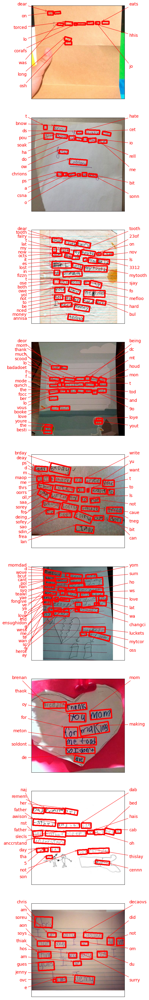

In [19]:
# 시각화해보기
fig, axs = plt.subplots(nrows=len(en_data), figsize=(20, 60))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=en_data[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

> #### feedback:
> - 이미지 자체에 box 및 annotation을 추가한 시각화 형태를 봤을 때 모델의 인식 결과가 좀 더 직관적으로 눈에 띈다.
> - 한 단어여도 글자들 중 좀 더 세로 길이가 긴 경우에 같은 단어로 인식이 잘 안되는 것을 볼 수 있다.(예 : `you`에서 `y`같이)
> - 비슷한 케이스로 `I` 대문자를 유독 크게 쓴 마지막 이미지에서는 `I`가 전부 다 빠진 채 인식된 것을 볼 수 있다.
> - 이번 모델에서는 영어의 경우 `I`, `l` 같이 다른 글자보다 위로 길어지는 글자의 경우 상대적으로 인식이 잘 안되는 것으로 파악된다.

### - Tesseract

In [20]:
# 라이브러리 설치
!sudo apt install tesseract-ocr-kor

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr-kor is already the newest version (4.00~git24-0e00fe6-1.2).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.


In [21]:
# 패키지 불러오기
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

In [22]:
# config 설정
custom_oem_psm_config = r'--oem 3 --psm 3'

> #### note:
> **시각화 관련**
> - `tesseract`의 경우 `keras_ocr`과 같이 편하게 예측 단어에 bounding box 및 annotation을 해주는 함수가 없다.
> - 그래서 `tesseract`의 결과 값을 `keras_ocr`값의 형태와 동일하게 만들어주어서 `keras_ocr.tools.drawAnnotations()` 메소드를 사용해 시각화할 예정이다.
>
>
> **`.image_to_data(image=)` 인자값 관련**
> - 또한, `pytesseract.image_to_data()`에 argument로 어떤 걸 넣어야 하나 싶어서 시험삼아 같은 이미지 정보를 가진 다른 종류의 객체들을 넣어봤다.
> - PIL Image 객체와 np.ndarray 를 넣어봤는데 흥미롭게도 객체 종류에 따라 인식한 단어 스펠링이 달랐다.
> - > 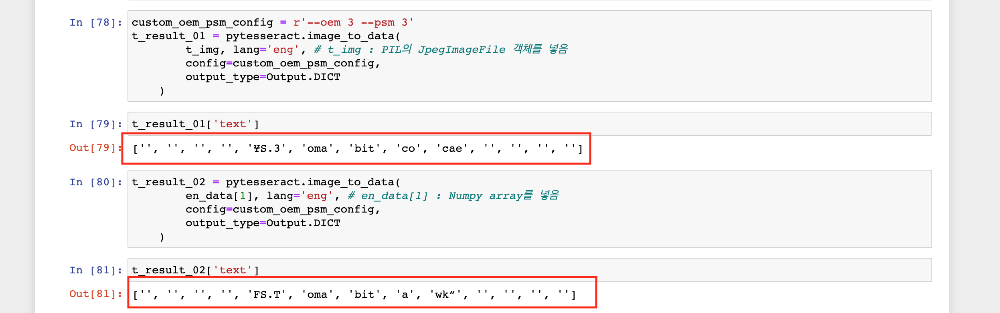
> - 어떤 경우가 더 나은지는 더 자세한 실험이 필요하겠지만 흥미로운 결과였다.
> - 이번 프로젝트에서는 둘의 차이가 그렇게 크지 않다고 판단하여 이미 생성된 np.ndarray 객체를 사용하였다.

##### ... 시각화 코드 만들기

In [23]:
# test 이미지로 tesseract의 결과값 뽑아보기
# 단어별로 detect 및 recognize
test_result = pytesseract.image_to_data(
        en_data[1], lang='eng',
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )

In [24]:
# tesseract 결과값 형태 확인
test_result

{'level': [1, 2, 3, 4, 5, 5, 5, 5, 5, 2, 3, 4, 5],
 'page_num': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'block_num': [0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2],
 'par_num': [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1],
 'line_num': [0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
 'word_num': [0, 0, 0, 0, 1, 2, 3, 4, 5, 0, 0, 0, 1],
 'left': [0, 138, 138, 138, 138, 200, 273, 308, 383, 0, 0, 0, 0],
 'top': [0, 293, 293, 293, 293, 298, 293, 300, 315, 0, 0, 0, 0],
 'width': [500, 293, 293, 293, 52, 63, 23, 67, 48, 500, 500, 500, 500],
 'height': [500, 42, 42, 42, 18, 13, 32, 35, 7, 500, 500, 500, 500],
 'conf': ['-1', '-1', '-1', '-1', 0, 81, 36, 38, 30, '-1', '-1', '-1', 95],
 'text': ['', '', '', '', 'FS.T', 'oma', 'bit', 'a', 'wk”', '', '', '', '']}

In [25]:
# keras_ocr의 결과값 형태 확인
# 원래는 list가 두 번 더 감싸주고 있음
prediction_groups[0][0]

[('dear',
  array([[ 87.,  32.],
         [117.,  32.],
         [117.,  52.],
         [ 87.,  52.]], dtype=float32)),
 ('on',
  array([[123.25293 ,  35.28824 ],
         [155.75293 ,  32.78823 ],
         [156.70587 ,  45.176468],
         [124.20587 ,  47.676476]], dtype=float32)),
 ('eats',
  array([[379.,  86.],
         [416.,  86.],
         [416., 101.],
         [379., 101.]], dtype=float32)),
 ('hhis',
  array([[298.,  87.],
         [334.,  87.],
         [334., 103.],
         [298., 103.]], dtype=float32)),
 ('torced',
  array([[180.8294  ,  87.217636],
         [221.12943 ,  90.31764 ],
         [219.65295 , 109.511765],
         [179.35294 , 106.41176 ]], dtype=float32)),
 ('jo',
  array([[344.,  88.],
         [367.,  88.],
         [367., 102.],
         [344., 102.]], dtype=float32)),
 ('lo',
  array([[229.,  94.],
         [244.,  94.],
         [244., 107.],
         [229., 107.]], dtype=float32)),
 ('corafs',
  array([[246.     ,  94.99999],
         [290.     ,  9

> #### note:
> - 위의 `keras_ocr` 결과값은 시각화 메소드에 아래와 같이 담긴다.
```python
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=en_data[idx], 
                                   predictions=prediction_groups[idx][0], ax=ax)
```
> - 따라서 `tesseract` 결과값으로 나오는 좌표 부분을 `keras_ocr`의 좌표 부분 형태로 맞춰줘야 한다.
> - `keras_ocr_tools.drawAnnotations()`에 넣어주는 인자값 형태를 보면...
> - `predictions=` 파라미터에서는 저렇게 (word, box) 형태의 튜플이 들어가는데,
> - box 부분은 8개의 값을 가진 것을 보니 4개 꼭지점의 x, y 좌표를 말하는 것으로 보인다.
> - 그리고 값들과 실제 box 값을 보니 8개의 값들을 아래 그림과 같이 제일 왼쪽 위부터 시계방향으로 `left top`, `right top`, `right bottom`, `left bottom`의 `x, y` 좌표를 나타내는 것으로 확인했다.
> - > 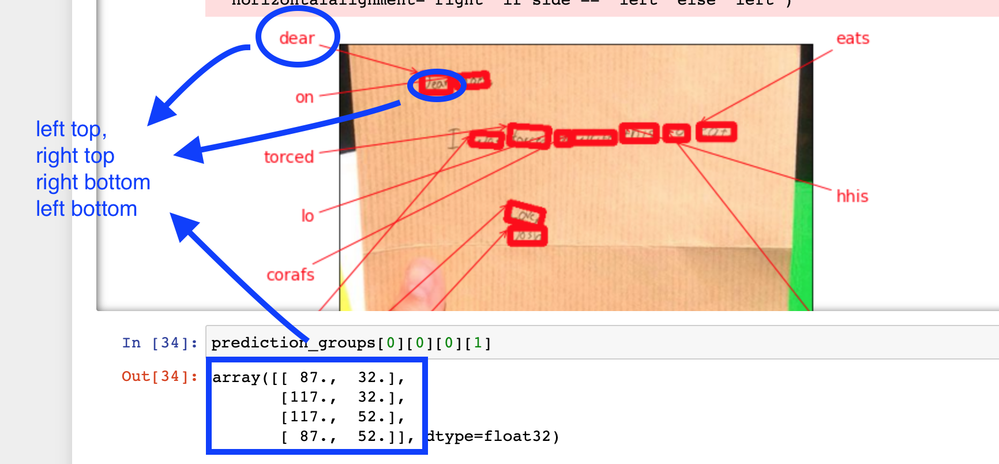  
> ##### 결론적으로 `tesseract` 결과값의 `left`, `top`, `width`, `height`을 `keras_ocr`의 4개 꼭지점의 x, y 좌표로 대응시켜주면 된다

In [26]:
# 테스트해보기 : 
# tesseract의 결과값 test_result를 keras_ocr 결과값 형태로 만들기
practice = []
for i in range(len(test_result['text'])):
    left_top = [test_result['left'][i], test_result['top'][i]]
    right_top = [test_result['left'][i]+test_result['width'][i], test_result['top'][i]]
    right_bottom = [test_result['left'][i]+test_result['width'][i], test_result['top'][i]+test_result['height'][i]]
    left_bottom = [test_result['left'][i], test_result['top'][i]+test_result['height'][i]]
    temp_box = np.array([left_top, right_top, right_bottom, left_bottom])
    practice.append((test_result['text'][i], temp_box))

In [27]:
# 변환됐는지 확인
practice

[('',
  array([[  0,   0],
         [500,   0],
         [500, 500],
         [  0, 500]])),
 ('',
  array([[138, 293],
         [431, 293],
         [431, 335],
         [138, 335]])),
 ('',
  array([[138, 293],
         [431, 293],
         [431, 335],
         [138, 335]])),
 ('',
  array([[138, 293],
         [431, 293],
         [431, 335],
         [138, 335]])),
 ('FS.T',
  array([[138, 293],
         [190, 293],
         [190, 311],
         [138, 311]])),
 ('oma',
  array([[200, 298],
         [263, 298],
         [263, 311],
         [200, 311]])),
 ('bit',
  array([[273, 293],
         [296, 293],
         [296, 325],
         [273, 325]])),
 ('a',
  array([[308, 300],
         [375, 300],
         [375, 335],
         [308, 335]])),
 ('wk”',
  array([[383, 315],
         [431, 315],
         [431, 322],
         [383, 322]])),
 ('',
  array([[  0,   0],
         [500,   0],
         [500, 500],
         [  0, 500]])),
 ('',
  array([[  0,   0],
         [500,   0],
        

/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


<AxesSubplot:>

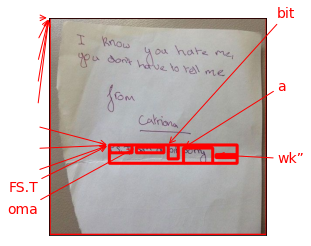

In [28]:
# 실제로 메소드에 넣어서 확인해보기
keras_ocr.tools.drawAnnotations(image=en_data[1],
                               predictions=practice)

> #### feedback:
> - 다행히 내가 원하는 대로 결과값의 변경 및 `keras_ocr.tools.drawAnnotations()` 메소드를 이용할 수 있게 됐다.

In [29]:
# 함수로 만들어 놓기
def switch_to_keras_output(dictionary):
    output = []
    for i in range(len(dictionary['text'])):
        left_top = [dictionary['left'][i], dictionary['top'][i]]
        right_top = [dictionary['left'][i]+dictionary['width'][i], dictionary['top'][i]]
        right_bottom = [dictionary['left'][i]+dictionary['width'][i], dictionary['top'][i]+dictionary['height'][i]]
        left_bottom = [dictionary['left'][i], dictionary['top'][i]+dictionary['height'][i]]
        temp_box = np.array([left_top, right_top, right_bottom, left_bottom])
        output.append((dictionary['text'][i], temp_box))
    return output

##### ... 글자 인식 실행

In [30]:
# tesseract 글자 인식 실행
tesseract_text_result = []
tesseract_outputs_4_vis = []
for i in range(len(en_data)):
    raw_result = pytesseract.image_to_data(
        en_data[i], lang='eng',
        config=custom_oem_psm_config,
        output_type=Output.DICT)
    
    # tesseract 결과값 keras_ocr 결과값 형태로 변환 및 추후 시각화를 위해 담기
    switched_output = switch_to_keras_output(raw_result)
    tesseract_outputs_4_vis.append(switched_output)
    
    # text만 따오기
    tesseract_text_result.append(raw_result['text'])

print('done')

done


In [31]:
# 잘 됐는지 확인
print(len(tesseract_text_result))
print(len(tesseract_outputs_4_vis))

9
9


In [32]:
# 텍스트는 전처리 거치기
for idx, text_list in enumerate(tesseract_text_result):
    tesseract_text_result[idx] = text_preprocess(text_list)

# 확인
print(tesseract_text_result[0])

['', '', '', '', 'dew', 'mon', '', '', '', ' ', '', '', '', 'z', '', 'twas', 'forces', 'to', 'curite', 'this', '¢2', '', '', '', ' ', '', '']


##### ... 결과 비교

In [33]:
tesseract_count_result = get_word_based_recall(tesseract_text_result)
tesseract_count_result


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT



[0, 0, 0, 0, 0, 0, 0, 0, 0]

> #### feedback:
> - `tesseract`는 글자 인식이라고 했지만, 공백을 인식하는 경우가 빈번하다.
> - 또한 단 하나의 단어도 정확한 스펠링과 정확한 위치에 맞게 인식한 것이 없다.

##### ... 시각화로 직관적 비교

/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


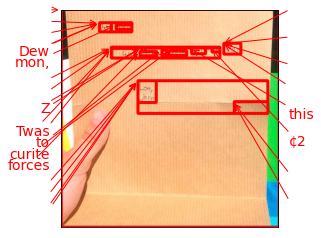

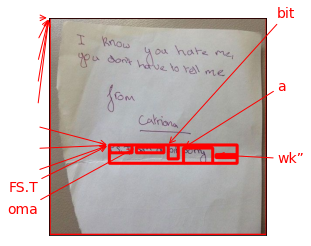

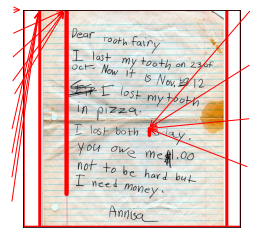

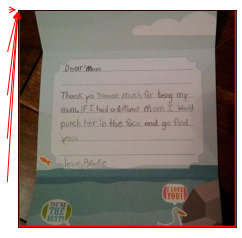

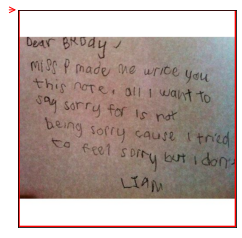

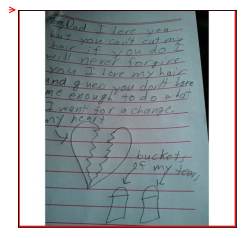

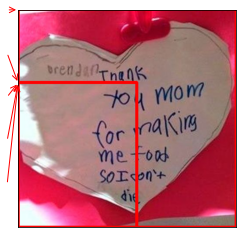

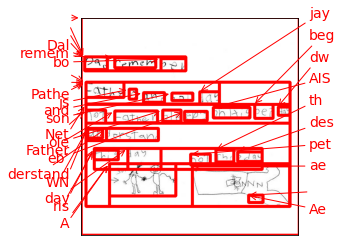

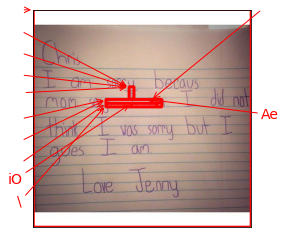

In [34]:
# 시각화
for i in range(len(en_data)):
    keras_ocr.tools.drawAnnotations(image=en_data[i],
                               predictions=tesseract_outputs_4_vis[i])

> #### feedback:
> - 약간 형편 없는 결과이다.
> - 인터넷에 대략 찾아보니 `tesseract`는 특정 조건(높은 화질, 글자의 확장 및 침식 거치기 등)이 있으면 더 성능이 좋다고 얘기하는데 그러한 이유인 듯하다.

### - EasyOCR

In [35]:
# 패키지 설치
!pip install easyocr

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [36]:
import easyocr

# 이미지 detection 및 recognition 모델의 언어 설정 및 객체 생성
reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory

##### ... 글자 인식 실행

In [37]:
# 이미지 인식 결과 담기
easyocr_original_result = [reader.readtext(data) for data in en_data]

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [38]:
# 이미지 인식 결과 내 텍스트 긁어오는 법 확인
easyocr_original_result[1][1][1]

'Ou'

In [39]:
# 1차적으로 텍스트 긁어오기
easyocr_result = []
for i in range(len(easyocr_original_result)):
    result_text = []
    for j in range(len(easyocr_original_result[i])):
        result_text.append(easyocr_original_result[i][j][1])
    easyocr_result.append(result_text)

easyocr_result[:2]

[['Dear', '06n', 'WJa $', 'Tore e', 'J iJfitc #his', '+0', 'eat.', 'josin'],
 ['I',
  'Ou',
  'haFz',
  'Pu',
  'Ka)',
  'Ve_ to Jell',
  'me',
  'Sox',
  'Ckriona',
  'sT',
  'a bit',
  'Know',
  '~i',
  'Oork',
  'om',
  'sony']]

In [40]:
# 최종적으로 비교 가능한 텍스트 상태로 만들기
easyocr_final_result = [text_preprocess(result) for result in easyocr_result]
easyocr_final_result[:2]

[['dear', '06n', 'wja $', 'tore e', 'j ijfitc #his', '+0', 'eat', 'josin'],
 ['i',
  'ou',
  'hafz',
  'pu',
  'ka)',
  've_ to jell',
  'me',
  'sox',
  'ckriona',
  'st',
  'a bit',
  'know',
  '~i',
  'oork',
  'om',
  'sony']]

##### ... 성능 검증

In [41]:
# Ground Truth와 비교
easyocr_count_result = get_word_based_recall(easyocr_final_result)
easyocr_count_result


1 got right in total
8.33% of Prediction are right based on words and their locations of GT


1 got right in total
5.26% of Prediction are right based on words and their locations of GT


1 got right in total
2.56% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


0 got right in total
0.0% of Prediction are right based on words and their locations of GT


1 got right in total
4.55% of Prediction are right based on words and their locations of GT


1 got right in total
4.35% of Prediction are right based on words and their locations of GT



[1, 1, 1, 0, 0, 0, 0, 1, 1]

> #### feedback:
> - `tesseract`보다는 낫지만 `keras_ocr`보다 낮은 수준의 정확도를 보인다.
> - 그리고 알파벳을 특수문자로 인식하는 경우가 빈번하다.
> - 모델 훈련 시 알파벳과 비슷한 모양새로 적힌 특수문자가 여럿 포함되어 있던 듯하다.

##### ... 시각화
- `tesseract`와 동일하게 `EasyOCR`의 결과값을 `keras_ocr` 결과값 형태로 만들어서 `keras_ocr.tools.drawAnnotations()` 메소드를 사용해 시각화할 예정이다.

In [42]:
# easy_ocr 결과값 형태 확인 1
easyocr_original_result[0]

[([[87, 33], [119, 33], [119, 51], [87, 51]], 'Dear', 0.7990341782569885),
 ([[123, 33], [157, 33], [157, 49], [123, 49]], '06n', 0.17523936367714807),
 ([[139, 95], [173, 95], [173, 111], [139, 111]], 'WJa $', 0.663723147799773),
 ([[181, 95], [223, 95], [223, 111], [181, 111]],
  'Tore e',
  0.46363436836292754),
 ([[228, 84], [336, 84], [336, 110], [228, 110]],
  'J iJfitc #his',
  0.26020946108830345),
 ([[343, 87], [367, 87], [367, 103], [343, 103]], '+0', 0.22758485679228815),
 ([[375, 83], [413, 83], [413, 103], [375, 103]], 'eat.', 0.24103258550167084),
 ([[183, 197], [217, 197], [217, 211], [183, 211]],
  'josin',
  0.22025533103559897)]

In [43]:
# easy_ocr 결과값 형태 확인 2
easyocr_original_result[0][0]

([[87, 33], [119, 33], [119, 51], [87, 51]], 'Dear', 0.7990341782569885)

In [44]:
# easy_ocr 결과값 형태 확인 3
easyocr_original_result[0][0][0]

[[87, 33], [119, 33], [119, 51], [87, 51]]

In [45]:
# easy_ocr 결과값 형태 확인 4
easyocr_original_result[0][0][0][0]

[87, 33]

In [46]:
# easy_ocr 결과값 형태 확인 5
easyocr_original_result[0][0][1]

'Dear'

In [47]:
# 함수로 만들어 놓기
def switch_to_keras_output_easy_ocr(result):
    output = []
    for i in range(len(result)):
        temp_output = []
        for j in range(len(result[i])):
            left_top = result[i][j][0][0]
            right_top = result[i][j][0][1]
            right_bottom = result[i][j][0][2]
            left_bottom = result[i][j][0][3]
            temp_box = np.array([left_top, right_top, right_bottom, left_bottom])
            temp_text = result[i][j][1]
            temp_output.append((temp_text, temp_box))
        output.append(temp_output)    
    return output

In [48]:
# 시각화를 위한 리스트 생성
easyocr_outputs_4_vis = switch_to_keras_output_easy_ocr(easyocr_original_result)

/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


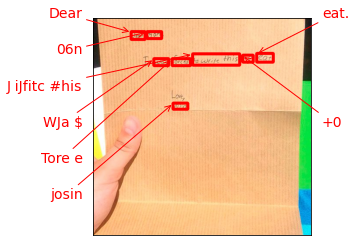

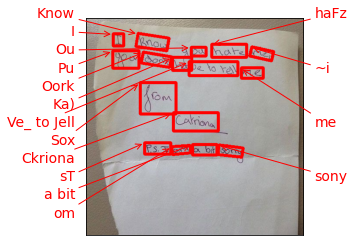

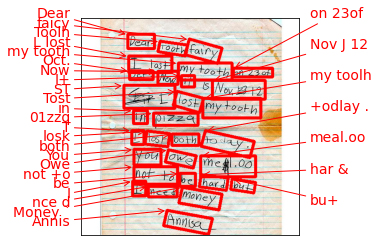

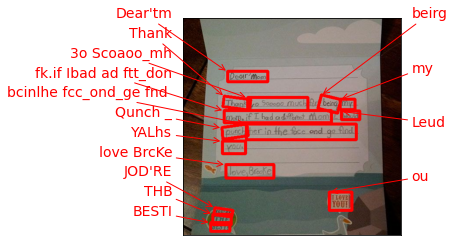

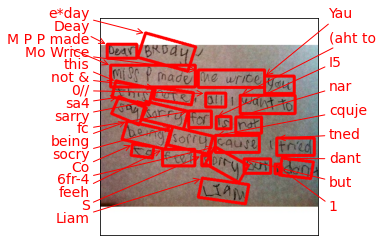

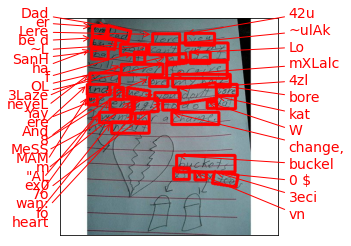

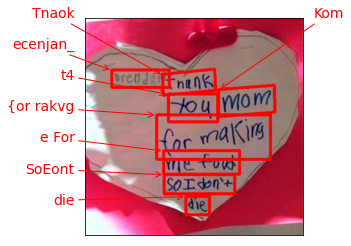

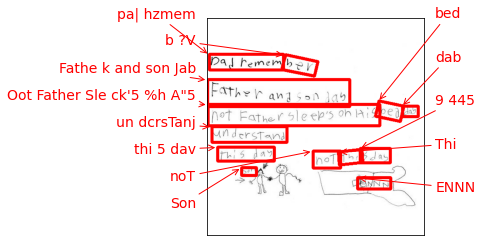

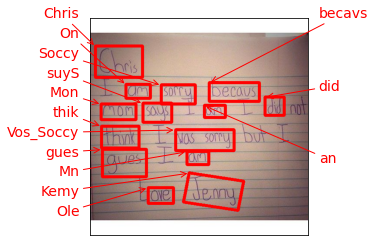

In [49]:
# 시각화
for i in range(len(en_data)):
    keras_ocr.tools.drawAnnotations(image=en_data[i],
                               predictions=easyocr_outputs_4_vis[i])

## Step3. 테스트 결과 정리
---
- 내용에 대한 정리 및 시각화

In [50]:
# pandas DataFrame으로 정리하기
import pandas as pd

df = pd.DataFrame([keras_count_result, tesseract_count_result, easyocr_count_result, [len(words) for words in labels]], 
             index=['keras_ocr', 'tesseract', 'EasyOCR', 'labels']).T

df

,keras_ocr,tesseract,EasyOCR,labels
0,1,0,1,12
1,1,0,1,19
2,4,0,1,39
3,2,0,0,29
4,1,0,0,31
5,0,0,0,44
6,0,0,0,12
7,1,0,1,22
8,1,0,1,23


<AxesSubplot:>

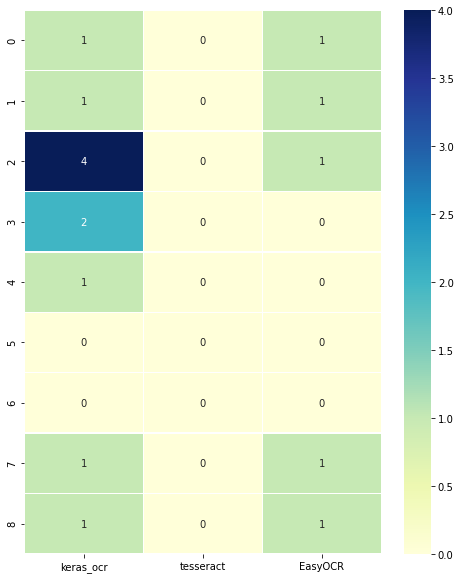

In [51]:
# 정답 개수만 컬럼별로 heatmap 시각화
import seaborn as sns

plt.figure(figsize=(8,10))
sns.heatmap(df.loc[:, 'keras_ocr':'EasyOCR'], cmap ='YlGnBu', linewidths = 0.30, annot = True)

In [52]:
# 최종 점수 합산
score_df = pd.DataFrame()
score_df['keras_ocr'] = df['keras_ocr'] - df['labels']
score_df['tesseract'] = df['tesseract'] - df['labels']
score_df['EasyOCR'] = df['EasyOCR'] - df['labels']

temp_df = pd.DataFrame({'keras_ocr':score_df['keras_ocr'].sum(), 
         'tesseract':score_df['tesseract'].sum(), 
         'EasyOCR':score_df['EasyOCR'].sum()}, index=[9])

score_df = pd.concat([score_df, temp_df])
score_df

,keras_ocr,tesseract,EasyOCR
0,-11,-12,-11
1,-18,-19,-18
2,-35,-39,-38
3,-27,-29,-29
4,-30,-31,-31
5,-44,-44,-44
6,-12,-12,-12
7,-21,-22,-21
8,-22,-23,-22
9,-220,-231,-226


/opt/conda/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


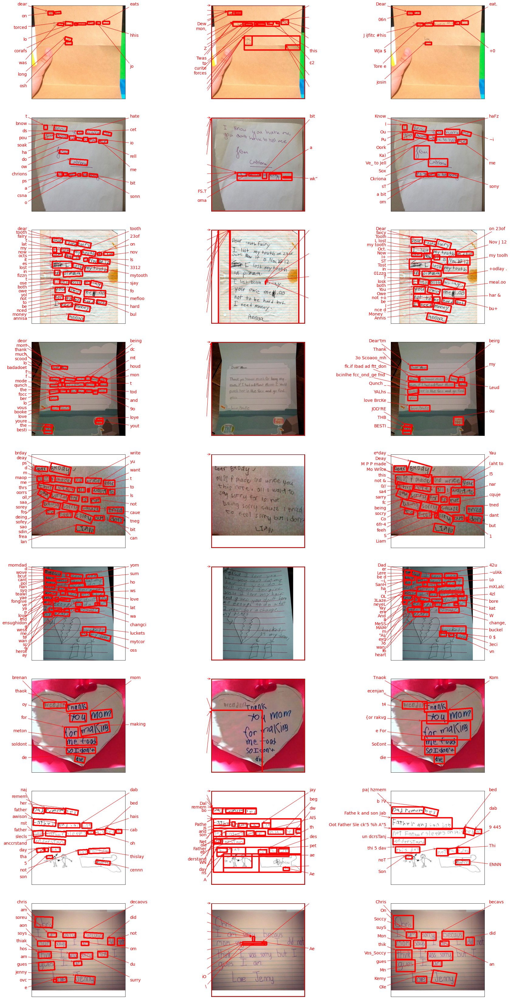

In [53]:
# 모델별 이미지 인식 결과 시각화
fig, axs = plt.subplots(nrows=len(en_data), ncols=3, figsize=(30, 60))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=en_data[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax[0])
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=en_data[idx], 
                                    predictions=tesseract_outputs_4_vis[idx], ax=ax[1])
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=en_data[idx], 
                                    predictions=easyocr_outputs_4_vis[idx], ax=ax[2])    

## Step4. 결과 분석과 결론 제시
---
- 내가 구현하려는 서비스의 목적과 내용 제시
- 해당 목적에 맞는 평가 기준 설정
- 윗 기준을 토대로 가장 나은 모델 선정

### 결론
##### 서비스 목적과 내용
  : OCR 모델 인식여부를 통해 유치원생의 손글씨를 개선해주자
##### 평가 기준
  : $i$ = 이미지 인덱스, $j$ = 모델 인덱스, $\sum_{j=1, 2, 3} PR^{ij} - GT^{ij} $로 계산해서 가장 높은 점수를 가진 모델을 선별한다.
##### 최종 결론
  : 정량적 평가를 기준으로 종합점수 `-220점`을 획득한 `keras_ocr`이 유치원생 아이들의 글씨를 그나마 잘 인식해서 더 발전시킬 여지가 있는 모델로 판단되어 최종 모델로 선정하였다.  
  : 이외에 정성적인 부분(bounding box 시각화)를 보았을 때, `keras_ocr`은 `EasyOCR`과 준수한 수준의 글자 인식 능력을 가졌으나, 정확한 영어 글자 판독에 있어서 `kears_ocr`이 더 정확한 것으로 보인다.  
  : 그러나 대체적으로 `EasyOCR`의 bounding box가 더 큼직하게 글자를 인식하여 때때로는 더 정확한 글자 localization 능력을 보여준다.(그러나 이점은 ROI 점수로 봤을 때 text 외의 공백이 더 넓어지면서 더 안좋게 작용할 수도 있다.)

## 회고
-----
#### Point 1) 하지 못한 많은 것들...
- 이번 프로젝트는 지난 BERT 모델 사용 프로젝트에 비해 이것저것 시도할 수 있는 게 많았는데 시간 여유상 하지 못한 점이 정말 아쉽다...
- 이미지 전처리를 안한다는 가정을 해서 그렇지만, 여러 방면에 있어서 robust한 모델을 찾고, 어떤 점이 모델마다 살짝씩 차이났는지 깊게 들어가지 못한 부분이 아쉽다.
- 또한, 성능 검증 관련하여 여러가지 방법들이 있었고 그 중에는 오픈소스의 코드를 일부 변형하거나 아니면 로컬에 가져와서 사용해야 했었는데, 흥미로웠지만 아직 오픈소스 사용 관련한 경험이 부족하여 빠른 실행을 위해 건너뛰었다.
- 아쉽다라는 말은 핑계로 남겠지만, 언젠간 이런 호기심과 탐구력을 마음껏 펼칠 수 있는 날이 왔으면 좋겠다...

#### Point 2) 한글 데이터셋
- 원래는 한글 데이터셋을 판별하는 한글 OCR 모델을 사용해보려 했다.
- 그런데 한글 OCR 모델의 정확성이 많이 떨어지거나(`tesseract`의 경우), `keras-ocr`의 경우 모델 자체가 한글로 훈련되지 않아, 원한다면 내가 직접 모델 관련 코드를 github에서 가져와서 한글을 넣고 훈련 시켜서 다시 예측시키는 과정이 필요했다.(github의 오픈소스를 이렇게 사용하는 건지 궁금하다)
- 하지만 그렇게 하기엔 프로젝트 하나가 너무 버거워지는 느낌이 있어서 중간에 영어로 언어를 변경했다.
- 아래는 `tesseract`에서 한글을 인식했을 때 나오는 한글 글자들이다.(위에도 썼듯이 서비스 자체가 '아이들의 손글씨 개선'이 목적이므로 이미지 전처리를 하지 않았다.)
- 결과를 보면 그다지 많은 글자를 인식하지 못한 것을 볼 수 있다
- > 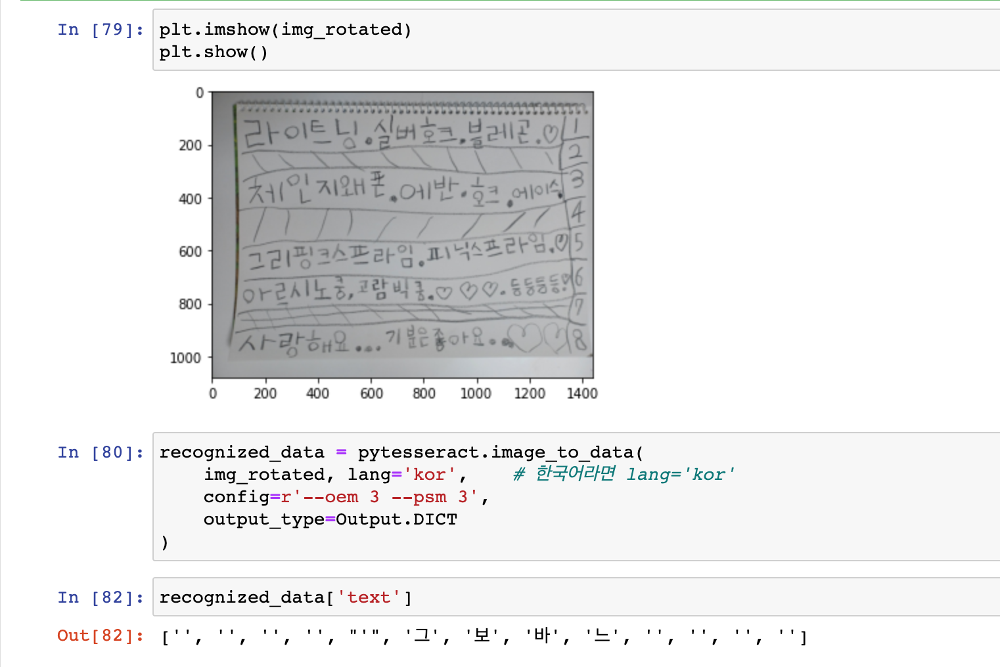  
-------
- 같은 이미지에 대한 `EasyOCR`이라는 오픈 소스 라이브러리의 판독 텍스트만 모아놓은 것이다.
- > 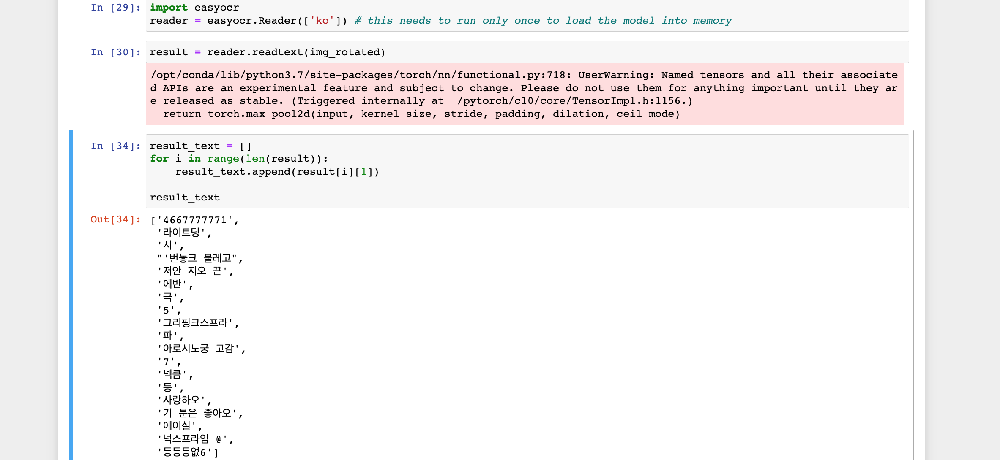
- `EasyOCR`은 약 80개국의 언어를 훈련했다고 하는데, 한글의 경우 `tesseract`보다 어린이 글씨 판독 정확성이 더 높은 것 같다.
- 여튼, 한국어의 경우 학습용으로 자주 쓰이는 글로벌한 모델에서는 OCR 정확성에 있어서 어려움이 있는 것 같다.

#### Point 3) 성능 검증을 위한 기준 설정 & 라벨 데이터의 존재
- 본 프로젝트를 위해서는, 그리고 앞으로 실무에 있어서도 내가 실험한 것의 성능을 평가하기 위한 정량적 계산 방법이 필요하다.
- 그리고 그 계산을 위해서는 라벨 데이터가 필요한데, 문제는 라벨 데이터를 만드는 일이 굉장히 수고롭다는 것이다.(말로만 들었는데 이번에 살짝 느껴본 듯하다...)
- 그 외에 성능 검증을 위한 지표 설정에 있어서 OCR에서 사용하는 지표가 그렇게 많은 줄 몰랐다.
- 인공지능 분야가 정말 세세하고 깊게 들어갈 수 있음을 느끼며, 나 또한 현업에서 보다 집중된 프로젝트에 참여해 깊은 지식과 경험을 쌓아보고 싶다.

#### Point 4) 오픈소스 사용 익히기
- 위와 같은 이유로 `github`에서 오픈소스 사용 및 contribution 하는 방법에 대해 이번에 굉장히 큰 갈증을 느끼게 되었다.
- 얼른 참여해보자...!

#### Point 5) 오픈소스 코드 읽기
- 위에 보면 `tesseract` 결과값을 `keras_ocr` 결과값 형태로 바꾸려는 시도를 볼 수 있다.(`keras_ocr.tools.drawAnnotations()`를 통해 쉽게 시각화하려고)
- 그런데 문제는 `keras_ocr` 결과 값으로 나오는 box 관련 값들의 정체가 무엇인지 알 수 없었다.(documentation에도 간략하게 box라고만 표현한다.)
- stackoverflow에도 찾아봤지만 마땅히 찾을 수 없었고, 감사하게도 그나마 남아 있는 `keras_ocr`의 `github`에 가서 모듈 파일을 읽어볼 수 있었다.
- 그런데 그것을 읽어서 이해하는 게 보통 어려운 게 아니었다...(코드를 하나하나 다 실행해봐야 온전히 이해할 수 있을 것 같다.)
- 그래도 다행인 것은, 해당 코드를 보고 대략적인 힌트를 얻어서 위와 같이 `keras_ocr` 결과값의 box들이 무엇을 뜻하는지 추리해낼 수 있었다.
- 이런 경험은 좋은 결과로 이어지지 않으면 참 시간 낭비인 것 같고 속상함이 커지는 순간들이다.
- 이번에는 내가 원한대로 코드를 짤 수 있어서 좋은 결과로 이어졌지만, 이런 순간들을 통해 그래도 성장함을 느낀다.
- 그래서 많이 부딪히고, 경험하며, 제일 중요한 것은 이런 것들이 잘 안 이루어졌을 때 속상해하지 않으려 한다.